In [29]:
import iris
import numpy as np
import xarray as xr
import holoviews as hv
import geoviews as gv
import geoviews.feature as gf
from cartopy import crs

hv.notebook_extension()
%output size=200
%opts Image {+framewise} [colorbar=True] Curve [xrotation=60]

In [37]:
# '/g/data/r87/dbi599/data_argo/raw/to-anom_Omon_ArgoRoemmich_2004-2015.nc'
infile = '/g/data/ua6/drstree/CMIP5/GCM/CSIRO-QCCCE/CSIRO-Mk3-6-0/historical/mon/ocean/thetao/r1i1p1/thetao_Omon_CSIRO-Mk3-6-0_historical_r1i1p1_198001-198912.nc'

In [39]:
iris.FUTURE.netcdf_promote=True
cube = iris.load_cube(infile)
print cube[:,0,::]

sea_water_potential_temperature / (K) (time: 120; latitude: 189; longitude: 192)
     Dimension coordinates:
          time                             x              -               -
          latitude                         -              x               -
          longitude                        -              -               x
     Scalar coordinates:
          depth: 5.0 m, bound=(0.0, 10.0) m
     Attributes:
          Conventions: CF-1.4
          associated_files: baseURL: http://cmip-pcmdi.llnl.gov/CMIP5/dataLocation gridspecFile: gridspec_ocean_fx_CSIRO-Mk3-6-0_historical_r0i0p0.nc...
          branch_time: 29200.0
          cmor_version: 2.6.0
          comment: Data is stored on the native ocean T-grid on which the data was generated....
          contact: Project leaders: Stephen Jeffrey (Stephen.Jeffrey@qld.gov.au) & Leon Rotstayn...
          creation_date: 2011-07-27T02:01:55Z
          experiment: historical
          experiment_id: historical
          forcing: An

In [40]:
dataset = gv.Dataset(cube[:,0,::])

In [41]:
print repr(dataset)

:Dataset   [time,longitude,latitude]   (sea_water_potential_temperature)


:HoloMap   [time]
   :Image   [longitude,latitude]   (sea_water_potential_temperature)
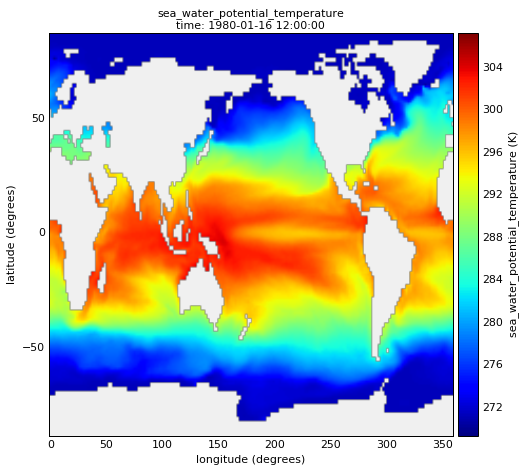
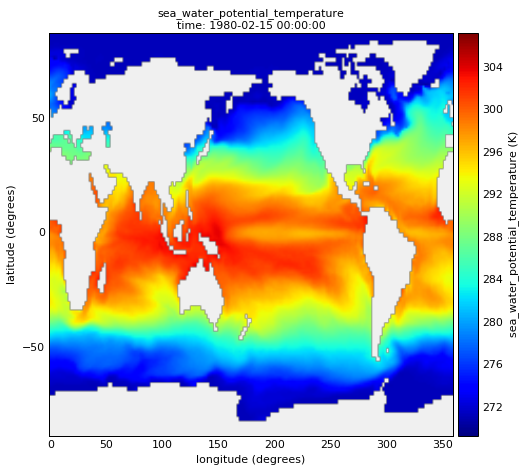
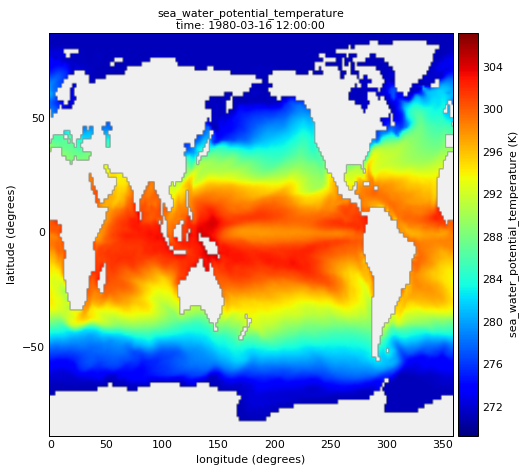
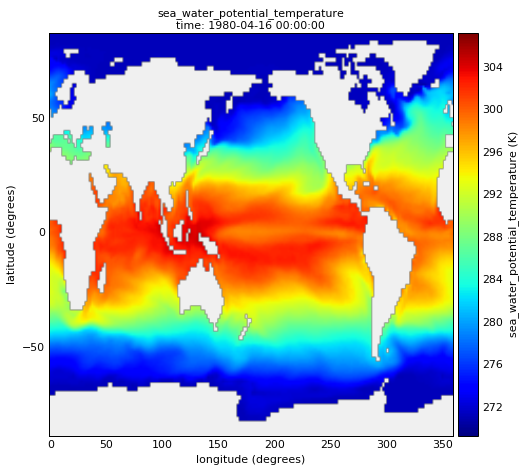
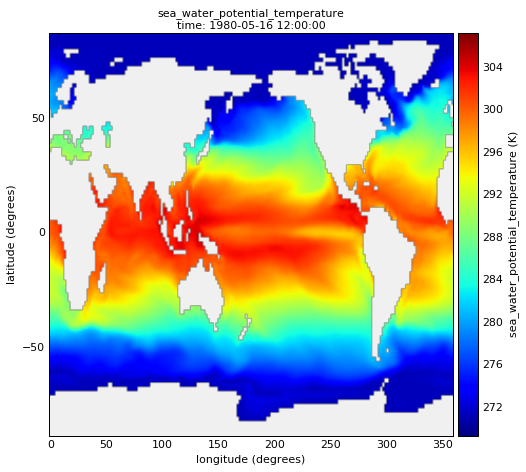
...
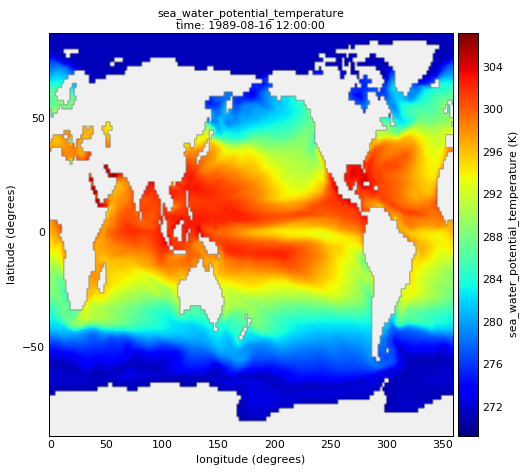
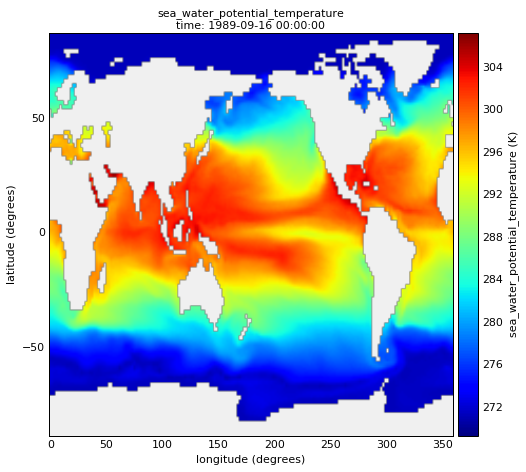
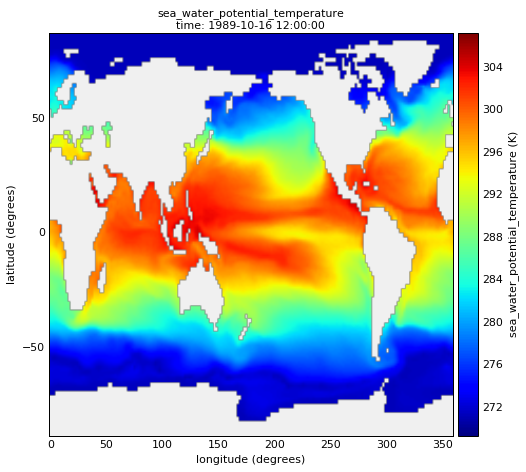
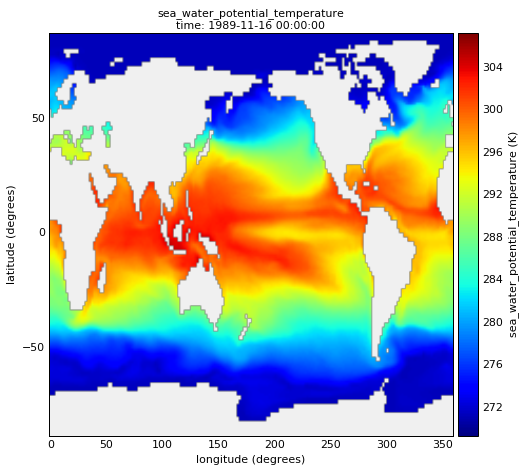
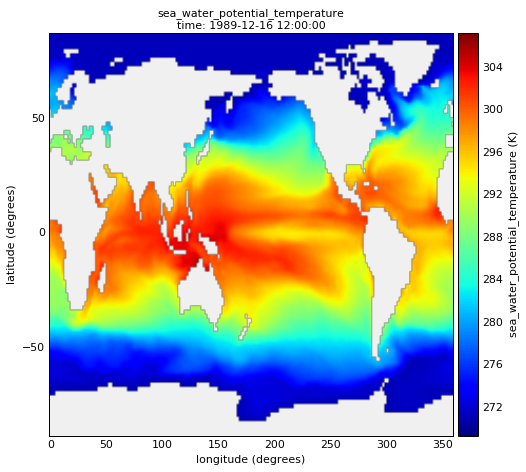

In [42]:
%%opts Image [] (cmap='jet') Overlay []
dataset.to(gv.Image, ['longitude', 'latitude']) # * gf.coastline